# Load the variable and API configurations

In [4]:
# Required Libraries
import os
import nest_asyncio
from dotenv import load_dotenv
from langchain.agents import Tool, initialize_agent
from langchain.chains import LLMChain
from langchain.prompts import PromptTemplate
from langchain.vectorstores.faiss import FAISS as FAISSVectorStore
from langchain.vectorstores import FAISS
from langchain.text_splitter import RecursiveCharacterTextSplitter
from gen_ai_hub.proxy.langchain.openai import ChatOpenAI, OpenAIEmbeddings
from gen_ai_hub.proxy.core.proxy_clients import get_proxy_client
from IPython.display import Markdown
import requests
import re
from typing_extensions import Annotated, TypedDict
from googlesearch import search
from gen_ai_hub.proxy.langchain.init_models import init_llm, init_embedding_model
from langchain_community.document_transformers.openai_functions import create_metadata_tagger
from langchain_community.vectorstores.hanavector import HanaDB
from langchain.memory import ConversationBufferMemory
from langchain.chains import ConversationalRetrievalChain
import json
from hdbcli import dbapi
# Import necessary libraries for LangChain and HANA DB operations
from hdbcli import dbapi
from langchain_community.vectorstores.hanavector import HanaDB
from gen_ai_hub.proxy.langchain.init_models import init_embedding_model, init_llm
from langchain_community.vectorstores.utils import DistanceStrategy

import config

# Load environment variables
load_dotenv()

# Allow nested event loops for async operations
nest_asyncio.apply()



# Connect with Hana Database

In [8]:
# Retrieve HANA connection details from environment variables
hana_address = os.environ.get('HANA_ADDRESS')
hana_port = os.environ.get('HANA_PORT')
hana_user = os.environ.get('HANA_UNAME')
hana_password = os.environ.get('HANA_PASS')

# Connect using dbapi
hdbconn = dbapi.connect(
    address=hana_address,
    port=hana_port,
    user=hana_user,
    password=hana_password,
    autocommit=True,
    sslValidateCertificate=False,
)

if hdbconn:
    print(f'User {hana_user} connected to HANA successfully using dbapi.')


# Initialize GPT-4o Model
def initialize_llm():
    proxy_client = get_proxy_client('gen-ai-hub')
    return ChatOpenAI(proxy_model_name="gpt-4o", proxy_client=proxy_client, temperature=0.7, top_p=0.9, max_tokens=2000)

# Initialize GPT-35 Turbo Model
def initialize_llm_3():
    proxy_client = get_proxy_client('gen-ai-hub')
    return ChatOpenAI(proxy_model_name="gpt-35-turbo", proxy_client=proxy_client, temperature=0.0, max_tokens=2000)


# Initialize LLM that supports OpenAI Functions for metadata tagging
llm35 = init_llm(
    'gpt-35-turbo',
    temperature=0.0, 
    max_tokens=1000,
)

embeddings = init_embedding_model('text-embedding-ada-002')

db = HanaDB(
    embedding=embeddings,
    connection=hdbconn,
    table_name="metaMind"
)

User DBADMIN connected to HANA successfully using dbapi.


# Dataset Info

In [3]:
import pandas as pd

# Specify the path to your CSV file
csv_file_path = './archive/train.csv'

# Read the CSV file into a pandas DataFrame
data = pd.read_csv(csv_file_path)

# Display the first few rows of the DataFrame
print(data.head())


                                             Context  \
0  I'm going through some things with my feelings...   
1  I'm going through some things with my feelings...   
2  I'm going through some things with my feelings...   
3  I'm going through some things with my feelings...   
4  I'm going through some things with my feelings...   

                                            Response  
0  If everyone thinks you're worthless, then mayb...  
1  Hello, and thank you for your question and see...  
2  First thing I'd suggest is getting the sleep y...  
3  Therapy is essential for those that are feelin...  
4  I first want to let you know that you are not ...  


In [38]:
data.shape

(3512, 3)

# Method 1: Metadata tagging with LLM Gpt 3.5 (Costly approach)

In [ ]:
import pandas as pd
from hdbcli import dbapi
from gen_ai_hub.proxy.langchain.init_models import init_llm

# Initialize GPT-3.5 (or LLM35)
llm = init_llm(
    'gpt-35-turbo',
    temperature=0.0, 
    max_tokens=1000,
)

# Define a function for metadata tagging
def generate_metadata(content):
    """
    Generate metadata using GPT-3.5 prompt engineering.
    """
    prompt = f"""
    Summarize the following content in  4 keywords focusing on the key context:

    {content}

    Summary:
    """
    response = llm.invoke(prompt)
    print(response)
    return response.content

# Step 2: Read CSV into DataFrame
csv_file_path = './archive/train.csv'
data = pd.read_csv(csv_file_path)
data = data[:50]  # Limit to 2 rows for testing

# Add `id` column and rename existing columns
data['id'] = data.index
data.rename(columns={'Context': 'name', 'Response': 'description'}, inplace=True)
data = data[['id', 'name', 'description']]  # Reorder columns to match table schema

# Truncate 'name' and 'description' columns to fit the schema
data['name'] = data['name'].str.slice(0, 1000)
data['description'] = data['description'].str.slice(0, 1000)

data = data.dropna(subset=['id', 'name', 'description'])
data['id'] = data['id'].astype(int)
data['name'] = data['name'].astype(str)
data['description'] = data['description'].astype(str)

# Generate Metadata Summaries
metadata_results = []
for index, row in data.iterrows():
    content = f"{row['name']} {row['description']}"
    print(f"Generating metadata for row {index}...")
    metadata = generate_metadata(content)
    metadata_results.append(metadata)

# Add metadata as a new column in the DataFrame
data['Chat_Context'] = metadata_results

# Connect to HANA Database
hdbconn = dbapi.connect(
    address=hana_address,
    port=hana_port,
    user=hana_user,
    password=hana_password,
    autocommit=True,
    sslValidateCertificate=False,
)

cursor = hdbconn.cursor()

cursor.execute("DROP TABLE metaMind")

# Create the metaMind table
cursor.execute("""
CREATE COLUMN TABLE metaMind (
    id INTEGER PRIMARY KEY,
    name NVARCHAR(1000),  -- Increased size to accommodate larger text
    description NVARCHAR(1000),
    Chat_Context NVARCHAR(1000)  -- Add metadata column
);
""")

hdbconn.commit()
cursor.close()

# Insert Data into the Table
insert_query = """
    INSERT INTO metaMind (id, name, description, Chat_Context)
    VALUES (?, ?, ?, ?)
"""

for i, row in enumerate(data.itertuples(index=False)):
    print(f"Inserting row {i}...")
    cursor.execute(insert_query, (int(row.id), row.name, row.description, row.Chat_Context))

# Commit changes and close connections
hdbconn.commit()
cursor.close()

print("Data with metadata tagging has been successfully inserted into the 'metaMind' table.")


Generating metadata for row 0...
content='Self-worth, social context, motivation, inspirational messages' additional_kwargs={'refusal': None} response_metadata={'token_usage': {'completion_tokens': 11, 'prompt_tokens': 297, 'total_tokens': 308, 'completion_tokens_details': None}, 'model_name': 'gpt-35-turbo', 'system_fingerprint': 'fp_808245b034', 'finish_reason': 'stop', 'logprobs': None} id='run-7f61d7ad-29a2-43a2-b88e-517a3bb19276-0' usage_metadata={'input_tokens': 297, 'output_tokens': 11, 'total_tokens': 308}
Generating metadata for row 1...
content='Feelings, worthlessness, change, counseling' additional_kwargs={'refusal': None} response_metadata={'token_usage': {'completion_tokens': 9, 'prompt_tokens': 314, 'total_tokens': 323, 'completion_tokens_details': None}, 'model_name': 'gpt-35-turbo', 'system_fingerprint': 'fp_808245b034', 'finish_reason': 'stop', 'logprobs': None} id='run-7ea07317-d060-4c4a-8a42-3f00cf75b0fa-0' usage_metadata={'input_tokens': 314, 'output_tokens': 9, 't

# Method 2: Metadata tagging using Semi-Supervised Learning

Calculating WCSS for different cluster sizes...


Finding Optimal Clusters: 100%|██████████| 299/299 [02:06<00:00,  2.36it/s]


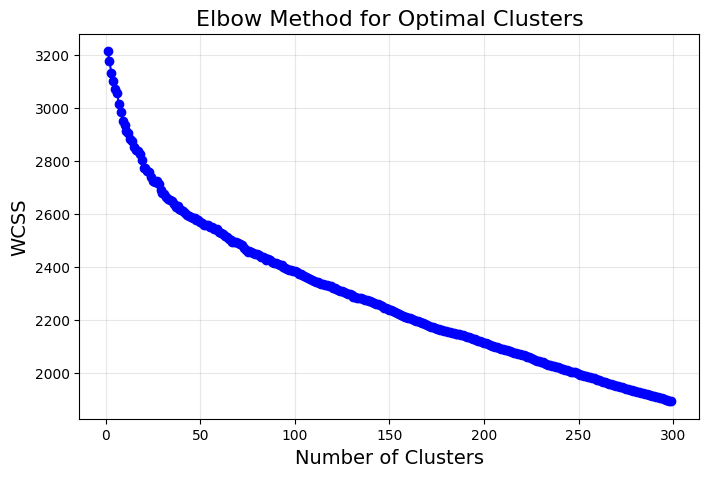

c:\Users\I585872\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


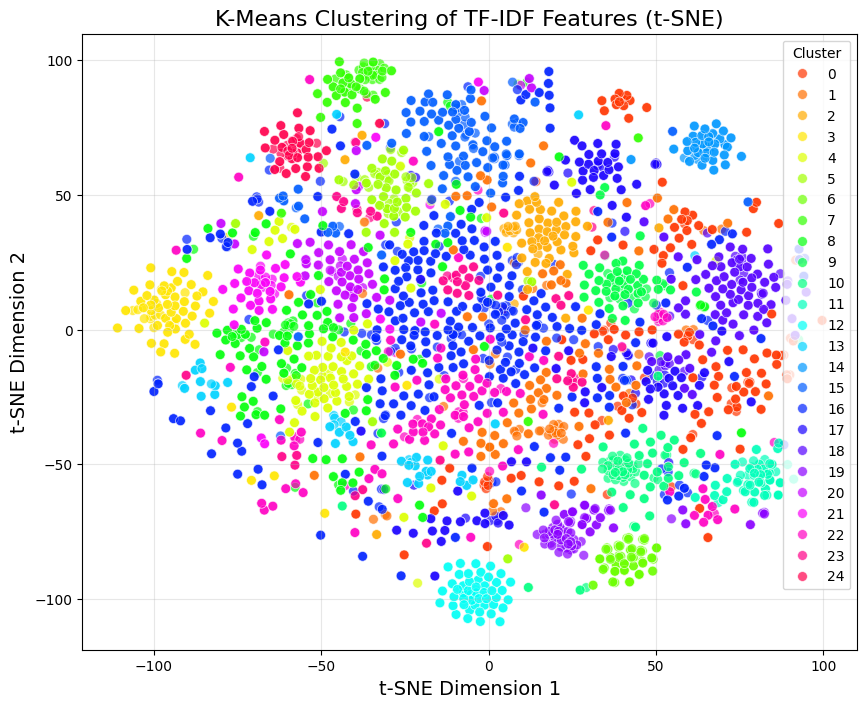

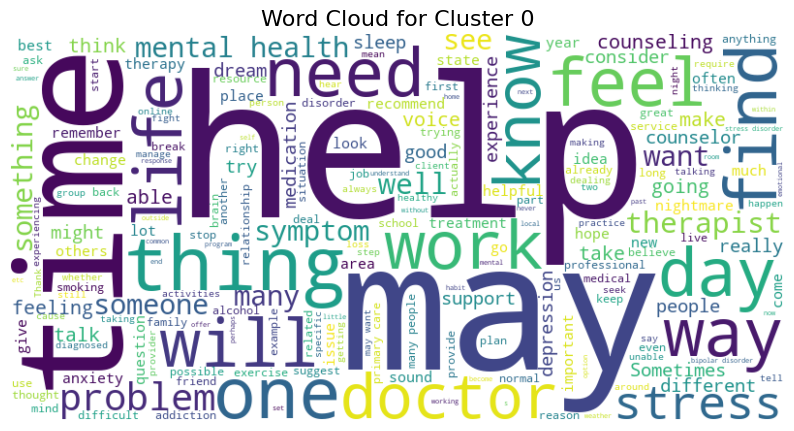

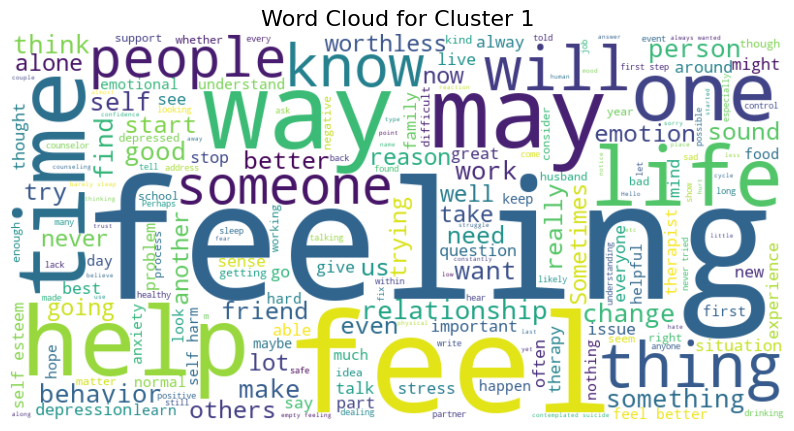

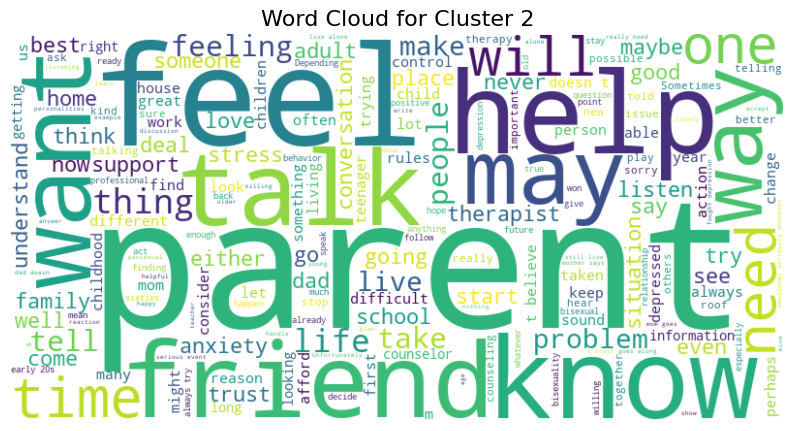

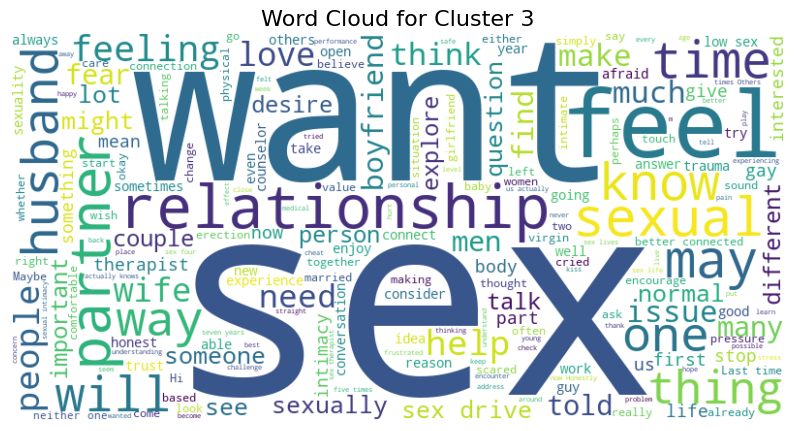

...

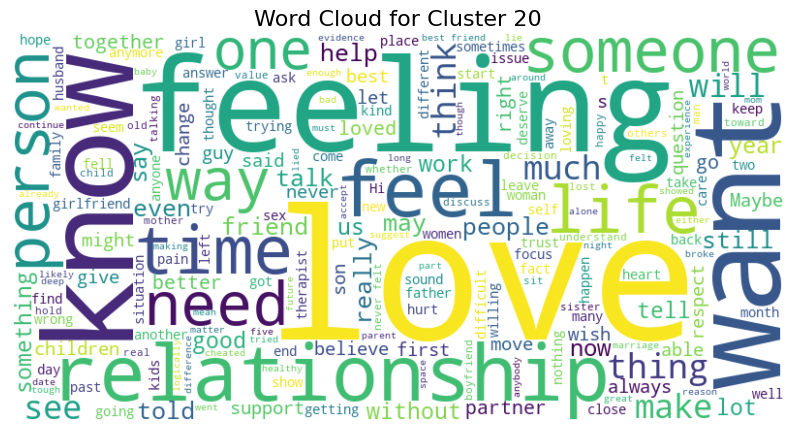

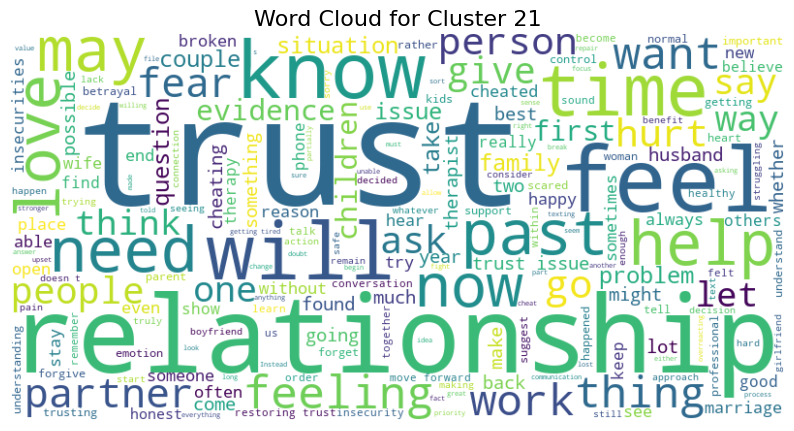

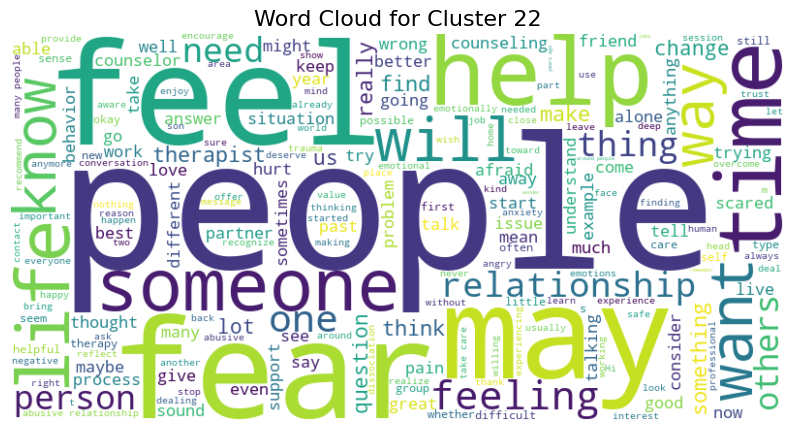

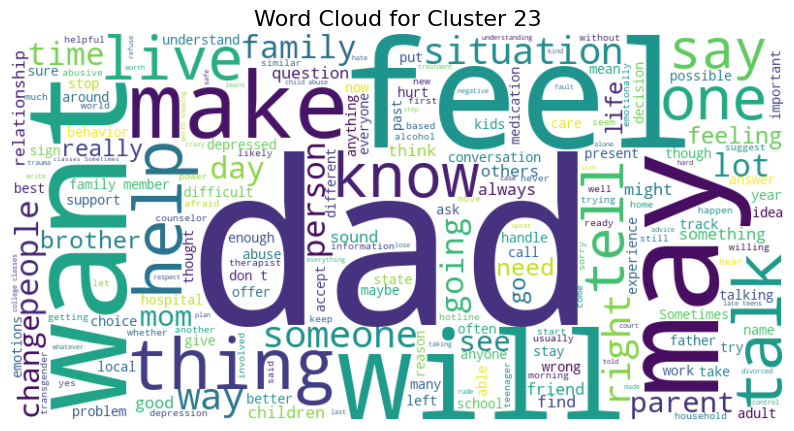

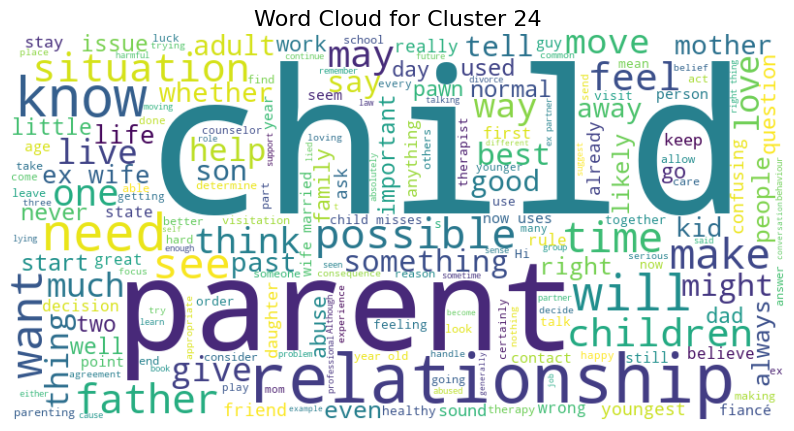

Top terms for Cluster 0: stress, help, disorder, voices, health
Top terms for Cluster 1: feeling, feel, self, feelings, way
Top terms for Cluster 2: parents, feel, live, don, school
Top terms for Cluster 3: sex, sexual, partner, wife, relationship
Top terms for Cluster 4: boyfriend, relationship, wrong, time, like
Top terms for Cluster 5: mom, mother, sister, want, don
Top terms for Cluster 6: nervous, therapy, sessions, normal, gone
Top terms for Cluster 7: daughter, school, afraid, children, break
Top terms for Cluster 8: relationship, partner, want, feel, past
Top terms for Cluster 9: thoughts, thought, thinking, like, negative
Top terms for Cluster 10: therapist, know, right, therapists, therapy
Top terms for Cluster 11: client, counselor, counseling, sessions, end
Top terms for Cluster 12: issues, address, counseling, history, ve
Top terms for Cluster 13: drinking, friend, guilty, feel, forgive
Top terms for Cluster 14: que, la, en, el, es
Top terms for Cluster 15: husband, marria

In [227]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import numpy as np
from hdbcli import dbapi
from tqdm import tqdm  # Import tqdm for the progress bar


# Step 1: Read CSV into DataFrame
csv_file_path = './archive/train.csv'
data = pd.read_csv(csv_file_path)

# Add `id` column and rename existing columns
data['id'] = data.index
data.rename(columns={'Context': 'name', 'Response': 'description'}, inplace=True)
data = data[['id', 'name', 'description']]  # Only include relevant columns

# Truncate 'name' and 'description' columns to fit the schema
data['name'] = data['name'].str.slice(0, 2000)
data['description'] = data['description'].str.slice(0, 2000)

data = data.dropna(subset=['id', 'name', 'description'])
data['id'] = data['id'].astype(int)
data['name'] = data['name'].astype(str)
data['description'] = data['description'].astype(str)

# Step 2: Combine columns for TF-IDF analysis
data['combined'] = data['name'] + " " + data['description']

# Step 3: TF-IDF Vectorization
vectorizer = TfidfVectorizer(max_features=500, stop_words="english")
tfidf_matrix = vectorizer.fit_transform(data['combined'])
feature_names = vectorizer.get_feature_names_out()

# Step 4: Determine Optimal Clusters using Elbow Method
wcss = []  # Within-cluster sum of squares
range_clusters = range(1, 300)

print("Calculating WCSS for different cluster sizes...")
for k in tqdm(range_clusters, desc="Finding Optimal Clusters"):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(tfidf_matrix)
    wcss.append(kmeans.inertia_)


# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(range_clusters, wcss, marker='o', linestyle='-', color='b')
plt.title("Elbow Method for Optimal Clusters", fontsize=16)
plt.xlabel("Number of Clusters", fontsize=14)
plt.ylabel("WCSS", fontsize=14)
plt.grid(alpha=0.3)
plt.show()

# Step 5: K-Means Clustering (with optimal number of clusters from elbow method)
num_clusters = 25  # Update based on the elbow method
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(tfidf_matrix)

# Add cluster labels to the DataFrame
data['Cluster'] = kmeans.labels_

# Step 6: Visualize Clusters using t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
reduced_data = tsne.fit_transform(tfidf_matrix.toarray())

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=reduced_data[:, 0],
    y=reduced_data[:, 1],
    hue=data['Cluster'],
    palette=sns.color_palette("hsv", num_clusters),
    s=50,
    alpha=0.7
)
plt.title("K-Means Clustering of TF-IDF Features (t-SNE)", fontsize=16)
plt.xlabel("t-SNE Dimension 1", fontsize=14)
plt.ylabel("t-SNE Dimension 2", fontsize=14)
plt.legend(title="Cluster", loc="best")
plt.grid(alpha=0.3)
plt.show()

# Step 7: Word Clouds for Each Cluster
for cluster in range(num_clusters):
    cluster_texts = data[data['Cluster'] == cluster]['combined'].str.cat(sep=" ")
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(cluster_texts)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for Cluster {cluster}", fontsize=16)
    plt.show()

# Step 8: Top Terms for Each Cluster
def top_terms_per_cluster(tfidf_matrix, labels, feature_names, top_n=5):
    cluster_top_terms = {}
    for cluster in range(num_clusters):
        cluster_indices = np.where(labels == cluster)[0]
        cluster_tfidf = tfidf_matrix[cluster_indices].mean(axis=0).A1
        top_indices = cluster_tfidf.argsort()[-top_n:][::-1]
        cluster_top_terms[cluster] = [feature_names[i] for i in top_indices]
    return cluster_top_terms

top_terms = top_terms_per_cluster(tfidf_matrix, kmeans.labels_, feature_names, top_n=5)
for cluster, terms in top_terms.items():
    print(f"Top terms for Cluster {cluster}: {', '.join(terms)}")

# Step 9: Metadata Tagging
data['Chat_Context'] = data['Cluster'].apply(lambda x: ", ".join(top_terms[x]))


## High Dimension visualize with t-SNE in 3D

c:\Users\I585872\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


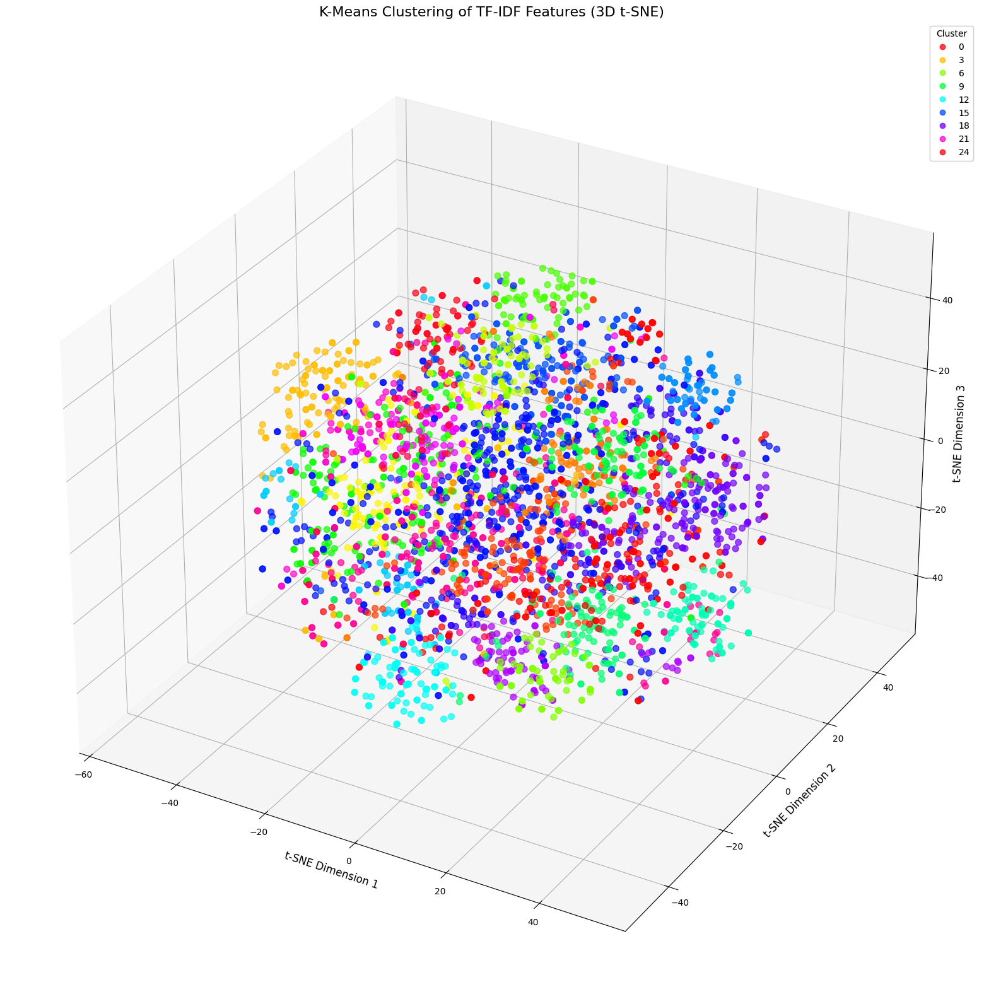

In [217]:
# Step 6: Visualize Clusters using t-SNE in 3D
from mpl_toolkits.mplot3d import Axes3D

tsne_3d = TSNE(n_components=3, random_state=42, perplexity=30, n_iter=1000)
reduced_data_3d = tsne_3d.fit_transform(tfidf_matrix.toarray())

fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')

# Create a scatter plot
scatter = ax.scatter(
    reduced_data_3d[:, 0],
    reduced_data_3d[:, 1],
    reduced_data_3d[:, 2],
    c=data['Cluster'],
    cmap="hsv",
    s=50,
    alpha=0.7
)

# Add labels and title
ax.set_title("K-Means Clustering of TF-IDF Features (3D t-SNE)", fontsize=16)
ax.set_xlabel("t-SNE Dimension 1", fontsize=12)
ax.set_ylabel("t-SNE Dimension 2", fontsize=12)
ax.set_zlabel("t-SNE Dimension 3", fontsize=12)

# Add legend
legend1 = ax.legend(
    *scatter.legend_elements(),
    title="Cluster",
    loc="upper right",
    fontsize=10
)
ax.add_artist(legend1)

plt.show()


c:\Users\I585872\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


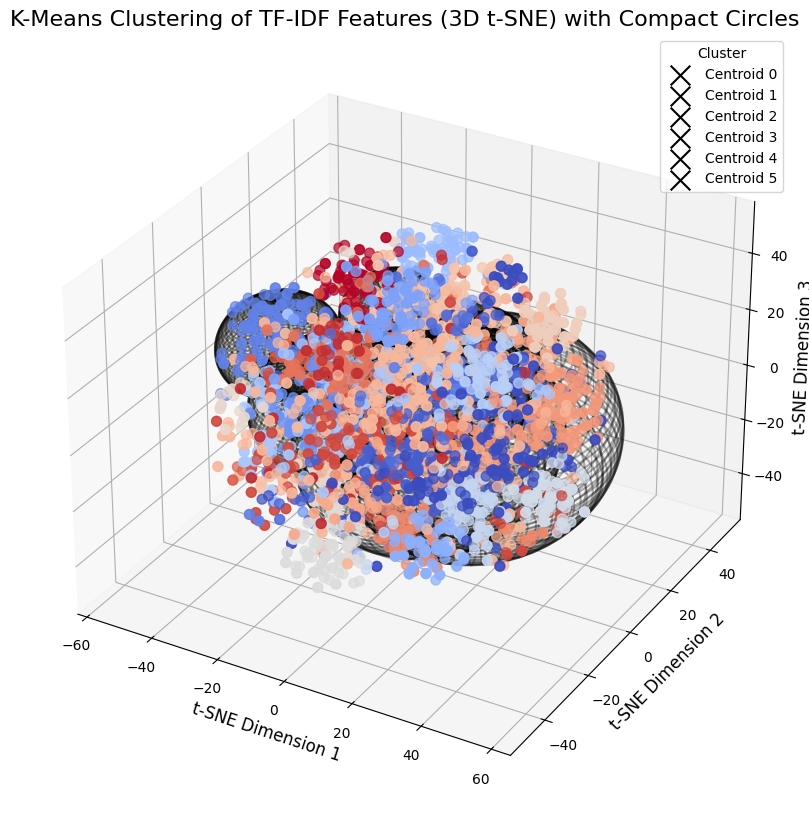

In [223]:
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Assuming num_clusters = 2 (set earlier)
num_clusters = 6
tsne_3d = TSNE(n_components=3, random_state=42, perplexity=30, n_iter=1000)
reduced_data_3d = tsne_3d.fit_transform(tfidf_matrix.toarray())

# Create a scatter plot
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    reduced_data_3d[:, 0],
    reduced_data_3d[:, 1],
    reduced_data_3d[:, 2],
    c=data['Cluster'],
    cmap="coolwarm",
    s=50,
    alpha=0.7
)

# Calculate centroids for the 2 clusters
centroids = []
for cluster in range(num_clusters):
    cluster_points = reduced_data_3d[data['Cluster'] == cluster]
    centroid = cluster_points.mean(axis=0)
    centroids.append(centroid)
    # Plot the centroid
    ax.scatter(
        centroid[0],
        centroid[1],
        centroid[2],
        color="black",
        s=200,
        marker="x",
        label=f"Centroid {cluster}"
    )

# Draw compact spheres for each cluster
for i, centroid in enumerate(centroids):
    cluster_points = reduced_data_3d[data['Cluster'] == i]
    # Use a smaller radius (e.g., 90th percentile distance)
    distances = cdist(cluster_points, [centroid]).flatten()
    radius = np.percentile(distances, 70)  # Compact radius (90th percentile)

    # Sphere equation
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x = radius * np.outer(np.cos(u), np.sin(v)) + centroid[0]
    y = radius * np.outer(np.sin(u), np.sin(v)) + centroid[1]
    z = radius * np.outer(np.ones(np.size(u)), np.cos(v)) + centroid[2]
    ax.plot_wireframe(x, y, z, color="black", alpha=0.3)

# Add labels and title
ax.set_title("K-Means Clustering of TF-IDF Features (3D t-SNE) with Compact Circles", fontsize=16)
ax.set_xlabel("t-SNE Dimension 1", fontsize=12)
ax.set_ylabel("t-SNE Dimension 2", fontsize=12)
ax.set_zlabel("t-SNE Dimension 3", fontsize=12)

# Add legend
ax.legend(title="Cluster", loc="best", fontsize=10)
plt.show()


# Upload the data with metadata tags into the database

In [228]:
# Step 4: Connect to HANA Database
hdbconn = dbapi.connect(
    address=hana_address,
    port=hana_port,
    user=hana_user,
    password=hana_password,
    autocommit=True,
    sslValidateCertificate=False,
)

cursor = hdbconn.cursor()

# Drop existing table
cursor.execute("DROP TABLE metaMind")

# Create table
cursor.execute("""
CREATE COLUMN TABLE metaMind (
    id INTEGER PRIMARY KEY,
    name NVARCHAR(2000), 
    description NVARCHAR(2000),
    Chat_Context NVARCHAR(2000),
    Cluster INTEGER
);
""")

hdbconn.commit()

# Insert data into the table
insert_query = """
    INSERT INTO metaMind (id, name, description, Chat_Context, Cluster)
    VALUES (?, ?, ?, ?, ?)
"""
data = data[:]
for i, row in tqdm(data.iterrows(), total=data.shape[0], desc="Inserting Rows into DB"):
    cursor.execute(insert_query, (row['id'], row['name'], row['description'], row['Chat_Context'], row['Cluster']))

hdbconn.commit()

print("Data successfully inserted into the HANA database.")



Inserting Rows into DB: 100%|██████████| 3508/3508 [06:01<00:00,  9.71it/s]


Data successfully inserted into the HANA database.


## Look at the uploaded table from the database

In [229]:
cursor = hdbconn.cursor()

# Step 2: Query the data
query = "SELECT * FROM metaMind"
cursor.execute(query)

# Step 3: Fetch and display the results
rows = cursor.fetchall()
print("Data in the metaMind table:")
for row in rows:
    print(row)

# Step 4: Close the connection
cursor.close()

Data in the metaMind table:
(0, "I'm going through some things with my feelings and myself. I barely sleep and I do nothing but think about how I'm worthless and how I shouldn't be here.\n   I've never tried or contemplated suicide. I've always wanted to fix my issues, but I never get around to it.\n   How can I change my feeling of being worthless to everyone?", "If everyone thinks you're worthless, then maybe you need to find new people to hang out with.Seriously, the social context in which a person lives is a big influence in self-esteem.Otherwise, you can go round and round trying to understand why you're not worthless, then go back to the same crowd and be knocked down again.There are many inspirational messages you can find in social media. \xa0Maybe read some of the ones which state that no person is worthless, and that everyone has a good purpose to their life.Also, since our culture is so saturated with the belief that if someone doesn't feel good about themselves that this i

In [230]:
cursor = hdbconn.cursor()

# Step 2: Query the data
query = "SELECT * FROM metaMind"
cursor.execute(query)

# Step 3: Fetch and display the results
rows = cursor.fetchall()

# Define column headers (modify based on your table schema)
headers = ["ID", "Name", "Description", "Chat_Context", "Cluster"]

# Print the header row
print(f"{headers[0]:<10} | {headers[1]:<30} | {headers[2]:<50} | {headers[3]:<30} | {headers[4]:<10}")
print("-" * 140)

# Print the data rows with truncation for long values
for row in rows:
    print(f"{str(row[0]):<10} | {str(row[1])[:30]:<30} | {str(row[2])[:50]:<50} | {str(row[3])[:30]:<30} | {str(row[4]):<10}")

# Step 4: Close the connection
cursor.close()


ID         | Name                           | Description                                        | Chat_Context                   | Cluster   
--------------------------------------------------------------------------------------------------------------------------------------------
0          | I'm going through some things  | If everyone thinks you're worthless, then maybe yo | feeling, feel, self, feelings, | 1         
1          | I'm going through some things  | Hello, and thank you for your question and seeking | thoughts, thought, thinking, l | 9         
2          | I'm going through some things  | First thing I'd suggest is getting the sleep you n | feeling, feel, self, feelings, | 1         
3          | I'm going through some things  | Therapy is essential for those that are feeling de | feeling, feel, self, feelings, | 1         
4          | I'm going through some things  | I first want to let you know that you are not alon | feeling, feel, self, feelings, | 1         
5

# RAG: Data retrieval and answer generation using embeddings and metadata 

In [105]:
from langchain.chains import RetrievalQA
from langchain_core.prompts import PromptTemplate

# Function to create and execute RAG-based agent without memory
def rag_agent(llm, db, question, k=2):
    # Step 1: Define the prompt template
    prompt_template = """
    You are and professional octor. Be concise and answer based on context.

    '''
    {context}
    '''

    Question: {question}
    """
    PROMPT = PromptTemplate(template=prompt_template, input_variables=["context", "question"])

    # Step 2: Create the RetrievalQA chain
    qa_chain = RetrievalQA.from_chain_type(
        llm=llm35,
        retriever=db.as_retriever(search_kwargs={"k": k}),  # Retrieve top k relevant chunks
        return_source_documents=True,
        chain_type_kwargs={"prompt": PROMPT},
        verbose=False,
    )

    # Step 3: Invoke the chain with the user's question
    result = qa_chain({"query": question})
    
    return result


In [106]:
# Function to display the result in a structured format
def display_qa_result(result):
    # Display the answer
    print("\nData:")
    print("=================================")
    print(result)
    print("\nAnswer from the LLM:")
    print(result['result'])
    
    # Display source document chunks
    source_docs = result["source_documents"]
    print("\nNumber of source document chunks used:", len(source_docs))
    print("=================================")
    
    # Print each source document content and metadata
    for idx, doc in enumerate(source_docs):
        print(f"\nSource Document {idx + 1}:")
        print(f"Metadata: {doc.metadata}")
        print(f"Page Content:\n{doc.page_content[:500]}...")  # Display first 500 characters
        print("-----" * 20)


### Example usage:


In [108]:
# Example usage:
question = "I'm going through some things with my feelings and myself. I barely sleep and I do nothing but think about how I'm worthless and how I shouldn't be here. I've never tried or contemplated suicide. I've always wanted to fix my issues, but I never get around to it. How can I change my feeling of being worthless to everyone?"
# question ='Hi help me?'
result = rag_agent(llm=llm35, db=db, question=question, k=2)

# Display the result
display_qa_result(result)


Data:
{'query': "I'm going through some things with my feelings and myself. I barely sleep and I do nothing but think about how I'm worthless and how I shouldn't be here. I've never tried or contemplated suicide. I've always wanted to fix my issues, but I never get around to it. How can I change my feeling of being worthless to everyone?", 'result': "Answer: It's important to prioritize getting the sleep you need and to focus on finding things in your life that you can be grateful for. Everyone has talents and a purpose in life, and with some help, you can work through these feelings of worthlessness.", 'source_documents': [Document(metadata={'id': 2, 'Chat_Context': "I'm going through some things with my feelings and myself. I barely sleep and I do nothing but think about how I'm worthless and how I shouldn't be here. I've never tried or contemplated suicide. I've always wanted to fix my issues, but I never get around to it. How can I change my feeling of being worthless to everyone?

# User Interface (End-to-End application)

In [10]:
import gradio as gr
from langchain.chains import RetrievalQA
from langchain_core.prompts import PromptTemplate

# Function to create and execute RAG-based agent
def rag_agent(llm, db, question, history, k=2):
    # Combine the last two conversations from history
    if len(history) >= 2:
        recent_history = "\n".join(
            [f"User: {item[0]}\nAssistant: {item[1]}" for item in history[-2:]]
        )
    else:
        recent_history = ""

    # Define the prompt template
    prompt_template = f"""
    You are a professional doctor. Be concise and answer in a Gen Z savage tone based on the given context.

    Recent History:
    {recent_history}

    context (only for reference):
    '''
    {{context}}
    '''

    Question: {{question}}
    """
    PROMPT = PromptTemplate(template=prompt_template, input_variables=["context", "question"])

    # Create the RetrievalQA chain
    qa_chain = RetrievalQA.from_chain_type(
        llm=llm,
        retriever=db.as_retriever(search_kwargs={"k": k}),
        return_source_documents=True,
        chain_type_kwargs={"prompt": PROMPT},
        verbose=False,
    )

    # Invoke the chain with the user's question
    result = qa_chain({"query": question})
    return result

# Format the RAG result for display
def format_qa_result(result):
    llm_response = result['result']

    # Format retrieved chunks
    source_chunks = "<div style='max-height: 300px; overflow-y: auto; padding: 10px;'>"
    for idx, doc in enumerate(result["source_documents"]):
        chunk_summary = f"<div style='margin-bottom: 20px;'><h4>Source Document {idx + 1}:</h4>"
        chunk_summary += f"<p><b>Metadata:</b> {doc.metadata}</p>"
        chunk_summary += f"<p><b>Content:</b> {doc.page_content[:500]}...</p></div>"
        source_chunks += chunk_summary
    source_chunks += "</div>"

    return llm_response, source_chunks

# Chatbot interaction handler
def chatbot_interaction(chat_history, user_input):
    if not user_input.strip():
        return chat_history, "<p style='color: red;'>Please ask a question.</p>"

    # Call the RAG agent
    result = rag_agent(llm=llm35, db=db, question=user_input, history=chat_history, k=2)

    # Extract and format results
    llm_response, source_chunks = format_qa_result(result)

    # Add user query and LLM response to chat history
    chat_history.append((user_input, llm_response))

    # Return updated chat history and source chunks
    return chat_history, source_chunks

# Gradio application
def build_gradio_interface():
    # Define UI components with CSS
    with gr.Blocks(css="""
        body {
            background: #1e1e2f;
            color: #FFFFFF;
            font-family: 'Orbitron', sans-serif;
        }

        .gradio-container {
            background-color: #1e1e2f !important;
            border-radius: 10px;
            padding: 20px;
            box-shadow: 0 0 20px rgba(0, 255, 255, 0.2);
        }

        .gradio-title {
            text-align: center;
            font-size: 36px;
            font-weight: bold;
            color: #00FFCC; /* Neon teal */
            text-shadow: 0 0 10px #00FFCC;
            margin-top: 10px;
            margin-bottom: 20px;
        }

        .gradio-subtitle {
            text-align: center;
            font-size: 18px;
            color: #B0B0B0;
            margin-bottom: 20px;
        }

        .chatbot {
            padding: 0 !important;
            margin: 0 !important;
            background: #2a2a40 !important;
            overflow-y: auto !important;
            box-shadow: 0 0 15px rgba(255, 0, 255, 0.3);
            border-radius: 10px;
        }

        .chatbot .chat-message {
            margin: 0 !important; /* Fix top margin */
            padding: 10px !important;
            background: rgba(0, 0, 0, 0.3) !important;
            border-radius: 8px !important;
            color: #FFFFFF !important;
            z-index: 1;
        }

        .source-chunks {
            background: rgba(42, 42, 64, 0.9);
            color: #FFFFFF;
            border-radius: 10px;
            padding: 15px;
            max-height: 400px;
            overflow-y: auto;
            line-height: 1.6;
            box-shadow: 0 0 15px rgba(0, 255, 204, 0.3);
        }

        .source-chunks h4 {
            color: #FFD700;
        }

        .source-chunks p {
            color: #FFFFFF;
        }

        .gradio-button {
            font-family: 'Orbitron', sans-serif;
            background: linear-gradient(90deg, #FF00FF, #00FFCC);
            color: #FFFFFF;
            border: none;
            border-radius: 10px;
            padding: 12px 25px;
            cursor: pointer;
            transition: 0.3s ease;
            text-shadow: 0 0 5px #FFFFFF;
        }

        .gradio-button:hover {
            background: linear-gradient(90deg, #00FFCC, #FF00FF);
        }

        footer {
            text-align: center;
            font-size: 12px;
            color: #B0B0B0;
            margin-top: 20px;
        }
    """) as ui:
        gr.Markdown("<div class='gradio-title'>MetaMind</div>")
        gr.Markdown("<div class='gradio-subtitle'>Your AI-powered health companion. Ask your medical questions and get concise, AI-powered answers.</div>")

        with gr.Row():
            with gr.Column(scale=3):
                chatbot = gr.Chatbot(label="Chat History", elem_classes="chatbot")
            with gr.Column(scale=2):
                source_display = gr.HTML(label="Retrieved Chunks", elem_classes="source-chunks")

        user_input = gr.Textbox(label="Your Question", placeholder="Type your question here...", lines=2)
        submit_button = gr.Button("Ask Doctor LLM", elem_classes="gradio-button")

        # Define interaction
        def update_ui(chat_history, user_input):
            return chatbot_interaction(chat_history, user_input)
        
        submit_button.click(
            update_ui,
            inputs=[chatbot, user_input],
            outputs=[chatbot, source_display]
        )

        gr.Markdown("<footer>Powered by Gradio | Designed for Gamers</footer>")

    return ui

# Run Gradio app
if __name__ == "__main__":
    gradio_app = build_gradio_interface()
    gradio_app.launch()


Running on local URL:  http://127.0.0.1:7864


c:\Users\I585872\AppData\Local\Programs\Python\Python310\lib\site-packages\gradio\analytics.py:106: UserWarning: IMPORTANT: You are using gradio version 4.44.0, however version 4.44.1 is available, please upgrade. 
--------
  warnings.warn(



To create a public link, set `share=True` in `launch()`.


Test question

I have a severe back problem. I've had 3 major and several minor operations, but I'm still in constant pain. How can I deal with the depression from this chronic pain?

so what should i do next?
